In [1]:
from pathlib import Path
from datatree import DataTree
import datatree
import xarray as xr
import matplotlib.pyplot as plt
import dask
import numpy as np
import pandas as pd

import valenspy as vp
from valenspy.cf_checks import cf_status, is_cf_compliant

from dask.diagnostics import ProgressBar, Profiler, ResourceProfiler, CacheProfiler

# Prepeartions
## Load in CMIP6 data

In [2]:
PATH=Path('/dodrio/scratch/projects/2022_200/project_output/RMIB-UGent/vsc46032_kobe/data/climate_explorer/CMIP6/Monthly/tas')
#Make a datatree by iterating over the subdirectories and then the files
tree_dict = {}
for ssp in PATH.iterdir():
    ssp_name = ssp.name
    if ssp.is_dir():
        for file in ssp.iterdir():
            ds = xr.open_dataset(file, chunks="auto")
            #If the time dimension is not a datetime object, convert it
            if not isinstance(ds['time'].values[0], np.datetime64):
                ds['time']=ds.indexes['time'].to_datetimeindex()
            #Convert the time dimension to 
            tree_dict[f"{ssp_name}/{ds.attrs['parent_source_id']}"] = ds
dt = DataTree.from_dict(tree_dict)
dt

/tmp/ipykernel_536658/1265312581.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ds['time']=ds.indexes['time'].to_datetimeindex()
/tmp/ipykernel_536658/1265312581.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  ds['time']=ds.indexes['time'].to_datetimeindex()
/tmp/ipykernel_536658/1265312581.py:11: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, '360_day', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.


DataTree('None', parent=None)
├── DataTree('ssp585')
│   ├── DataTree('GFDL-ESM4')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16T12:00:00 ... 2100-12-16T12...
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/52)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu Jun 24 10:38:59 2021: ncks -v tas tas_mon_...
│   │           source:                    GFDL-ESM4 (2018):\natmos: GFDL-AM4.1 (Cubed-sp...
│   │           institution:               National Oceanic and Atmospheric Administratio...
│   │           Conventions:               CF-1.7 CMIP-6.0 UGRID-1.0
│   │           external_variables:        areacella
│   │           ...                        ...
│   │           variant_label:             r1i1p1f1
│   │           cmip6-ng:                  \ncontact = cmip6-archive@env.ethz.ch\ndescrip...
│   │           original_file_names:       /net/atmos/data/cmip6/historical/Amon/tas/GFDL...
│   │           original_file_hash_codes:  e057084ec0465ff122f8bf6b8ab4e98d3c5e96a3504776...
│   │           CDO:                       Climate Data Operators version 1.9.3 (http://m...
│   │           NCO:                       4.7.2
│   ├── DataTree('GISS-E2-1-G')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16T12:00:00 ... 2100-12-16T12...
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/54)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu Jun 24 10:42:29 2021: ncks -v tas tas_mon_...
│   │           source:                    GISS-E2.1G (2019): \naerosol: Varies with phys...
│   │           institution:               Goddard Institute for Space Studies, New York,...
│   │           Conventions:               CF-1.7 CMIP-6.2
│   │           activity_id:               CMIP
│   │           ...                        ...
│   │           cmor_version:              3.3.2
│   │           cmip6-ng:                  \ncontact = cmip6-archive@env.ethz.ch\ndescrip...
│   │           original_file_names:       /net/atmos/data/cmip6/historical/Amon/tas/GISS...
│   │           original_file_hash_codes:  3fc801bb6e8216909ed6b886898518962a6d3c837a7aa8...
│   │           CDO:                       Climate Data Operators version 1.9.3 (http://m...
│   │           NCO:                       4.7.2
│   ├── DataTree('HadGEM3-GC31-MM')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16 1850-02-16 ... 2100-12-16
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/53)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu

In [3]:
ds=dt['ssp585/EC-Earth3-Veg'].ds
ds

<xarray.DatasetView> Size: 333MB
Dimensions:  (lat: 144, lon: 192, time: 3012)
Coordinates:
    height   float64 8B ...
  * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
  * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * time     (time) datetime64[ns] 24kB 1850-01-16T12:00:00 ... 2100-12-16T12...
Data variables:
    tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
Attributes: (12/51)
    CDI:                       Climate Data Interface version ?? (http://mpim...
    history:                   Thu Jun 24 10:28:03 2021: ncks -v tas tas_mon_...
    source:                    EC-Earth3-Veg (2019): \naerosol: none\natmos: ...
    institution:               AEMET, Spain; BSC, Spain; CNR-ISAC, Italy; DMI...
    Conventions:               CF-1.7 CMIP-6.2
    activity_id:               CMIP
    ...                        ...
    tracking_id:               hdl:21.14100/4433ff28-c26a-4620-9435-9a2332712cb6
    cmip6-ng:                  \ncontact = cmip6-archive@env.ethz.ch\ndescrip...
    original_file_names:       /net/atmos/data/cmip6/historical/Amon/tas/EC-E...
    original_file_hash_codes:  5a73032dda01dab6093779dac650c2f6247a1839df36cb...
    CDO:                       Climate Data Operators version 1.9.3 (http://m...
    NCO:                       4.7.2

## Temperature evolution

In [8]:
def temp_warming(ds, ref, rol_years, freq_monthly=True):
    """
    Calculate the rolling-time area average warming compared to a reference

    Parameters
    ----------
    ds : xarray.Dataset
        Dataset containing the model data
    ref : xarray.Dataset
        Dataset containing the reference period
    rol_years : int
        Number of years for which to take a rolling average for the temperature
    
    Returns
    -------
    ds_temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    """
    rol_amount = rol_years * 12
    if not freq_monthly:
        ds = ds.resample(time="ME").mean()
    ref_temp = ref.tas.mean()
    rol = ds.mean(dim=['lat','lon']).tas.rolling(time=rol_amount, center=True).mean()
    ds_temp_warming = rol - ref_temp
    #Keep the ds attributes
    ds_temp_warming.attrs = ds.attrs
    #Adding some attribute information
    ds_temp_warming.attrs['Reference period'] = f"{ref.time.values[0]} - {ref.time.values[-1]}"
    ds_temp_warming.attrs['Rolling years'] = rol_years
    ds_temp_warming.attrs['Frequency'] = "Monthly" if freq_monthly else "Resampled to monthly"

    return ds_temp_warming

def plot_temp_warming(ds_temp_warming, ax, detailed=True, **kwargs):
    """
    Plot the rolling-time area average warming compared to a reference

    Parameters
    ----------
    ds_temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    ax : matplotlib.axes.Axes
        Axes object to plot the data on
    kwargs : dict
        Additional keyword arguments to pass to the plot function
    """
    ds_temp_warming.plot(ax=ax, **kwargs)
    start_ref = pd.to_datetime(ds_temp_warming.attrs['Reference period'].split(" - ")[0])
    end_ref = pd.to_datetime(ds_temp_warming.attrs['Reference period'].split(" - ")[1])
    if detailed:
        ax.axvspan(start_ref, end_ref, color='gray', alpha=0.5)
        ax.set_title(f"Rolling {ds_temp_warming.attrs['Rolling years']} year area-average warming compared to {start_ref:%Y-%m} - {end_ref:%Y-%m}")
        ax.grid()
    ax.set_ylabel("Temperature anomaly (°C)")
    ax.set_xlabel("Time")
    left, right = ax.get_xlim()
    if pd.to_datetime(left) > start_ref:
        ax.set_xlim(left=start_ref)

    return ax

In [9]:
warming_level = vp.Model2Ref(temp_warming, plot_temp_warming, 'Warming levels', 'Calculate the crossing times for different warming levels')

In [10]:
ref_temp_GWL = ds.sel(time=slice('1850', '1900'))

with ProgressBar():
    result_GWLs = warming_level.apply(ds, ref_temp_GWL, rol_years=30)

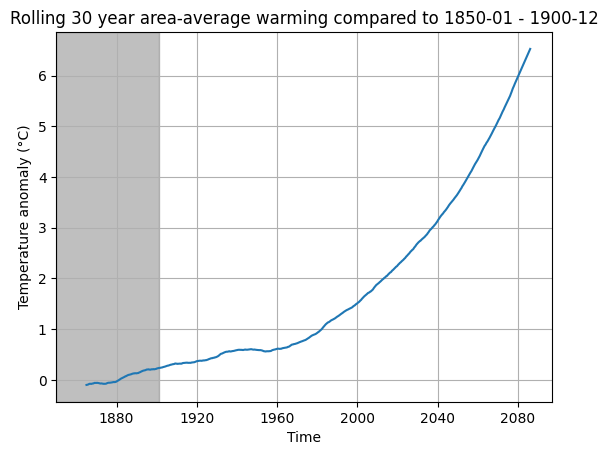

In [11]:
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots()
warming_level.visualize(result_GWLs, detailed=True)
plt.show()

# Analysis
## GWL
A $Y$°C GWL is the climatological period ($x$-year average) for which the global mean temperature anomoly compared to a reference period is $Y$°C for the first time since the reference period.

In [12]:
def GWL(ds, ref, rol_years, levels=[1,2,3], freq_monthly=True):
    """
    Calculate the crossing times for different warming levels

    Parameters
    ----------
    ds : xarray.Dataset
        Dataset containing the model data
    ref : xarray.Dataset
        Dataset containing the reference period
    rol_years : int
        Number of years for which to take a rolling average for the temperature
    levels : list
        List of warming levels to calculate the crossing times for
    freq_monthly : bool
        Whether to resample the data to monthly frequency
    
    Returns
    -------
    ds_temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    crossingtimes : dict
        Dictionary containing the crossing times for each warming level
    """
    ds_temp_warming = temp_warming(ds, ref, rol_years, freq_monthly)
    crossingtimes = {}
    ds_temp_warming = ds_temp_warming.compute()
    for level in levels:
        try:
            crossingtimes[level] = ds_temp_warming.time.where(ds_temp_warming >= level, drop=True).idxmin('time').values
        except ValueError:
            crossingtimes[level] = False
    return ds_temp_warming, crossingtimes

def plot_GWL(ds_temp_warming, crossingtimes, ax, detailed=True, **kwargs):
    """
    Plot the crossing times for different warming levels

    Parameters
    ----------
    ds_temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    crossingtimes : dict
        Dictionary containing the crossing times for each warming level
    ax : matplotlib.axes.Axes
        Axes object to plot the data on
    kwargs : dict
        Additional keyword arguments to pass to the plot
    
    Returns
    -------
    ax : matplotlib.axes.Axes
        Axes object with the plot
    """
    plot_temp_warming(ds_temp_warming, ax=ax, detailed=detailed, **kwargs)            
    if detailed:
        for level, time in crossingtimes.items():
            if time:
                ax.plot(time, level, 'ro')
                ax.text(time, level, f'{pd.to_datetime(time).year}', verticalalignment='bottom', horizontalalignment='right')
                ax.axhline(level, color="black", linestyle='--', alpha=0.7, label=f'{level:.2f}°C warming level')
    return ax

## Additional warming
Another method to calculate the global warming level is to calculate the time it takes for a CMIP6 model to heat up by the additional warming compared to a reference period needed to reach a certain global warming level starting from the observed warming between the pre-industrial period and the reference period. This assumes that the model has warmed the same amount as the observations between the pre-industrial period and the reference period. 

In other words - it measures the time it takes for a model to warm (GWL - observed warming) starting from a chosen reference period. 

In [13]:
def GWL_additional_warming(ds, ref, obs_since_preind, rol_years, levels=[1,2,3], freq_monthly=True):
    """
    Calculate the crossing time required to reach the given warming level from the reference period assuming that the observed warming has already taken place.
    In other words, calculate the time it takes to heat up the additional warming needed to get from the observed warming (reference vs pre-industrial) to the desired warming level.

    Parameters
    ----------
    ds : xarray.Dataset
        Dataset containing the model data
    ref : xarray.Dataset
        Dataset containing the reference period
    obs_since_preind : xarray.Dataset
        Dataset containing the observed warming since the pre-industrial period
    rol_years : int
        Number of years for which to take a rolling average for the temperature
    levels : list
        List of warming levels to calculate the crossing times for
    freq_monthly : bool
        Whether to resample the data to monthly frequency
    
    Returns
    -------
    ds_temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    crossingtimes : dict
        Dictionary containing the crossing times for each warming level
    """
    levels = [l-obs_since_preind for l in levels]
    return GWL(ds, ref, rol_years, levels, freq_monthly)

def GWL_additional_warming_plot(ds_temp_warming, crossingtimes, ax, add_obs_warming=None, detailed=True, **kwargs):
    if add_obs_warming:
        start_ref = pd.to_datetime(ds_temp_warming.attrs['Reference period'].split(" - ")[0])
        end_ref = pd.to_datetime(ds_temp_warming.attrs['Reference period'].split(" - ")[1])
        plot_GWL(ds_temp_warming, crossingtimes, ax=ax, detailed=False, alpha=0.4, label=f"GWL ({start_ref:%Y} - {end_ref:%Y})")
        ds_temp_warming_obs = ds_temp_warming + add_obs_warming
        ds_temp_warming_obs.attrs = ds_temp_warming.attrs
        plot_GWL(ds_temp_warming_obs, crossingtimes, ax=ax, detailed=detailed, label=f"GWL ({start_ref:%Y} - {end_ref:%Y} + obs {add_obs_warming})", **kwargs)
        
    else:
        plot_GWL(ds_temp_warming, crossingtimes, ax=ax, detailed=detailed, **kwargs)
    return ax

## Combinding the two GWL methods

In [14]:
GWL_diag = vp.Model2Ref(GWL, plot_GWL, 'Warming levels', 'Calculate the crossing times for different warming levels')
GWL_additional_warming_diag = vp.Model2Ref(GWL_additional_warming, GWL_additional_warming_plot, 'Warming levels', 'Calculate the crossing times for different warming levels')


In [15]:

pre_ind_ref = ds.sel(time=slice('1850', '1900'))
recent_past_ref = ds.sel(time=slice('1985', '2014'))

with ProgressBar():
    result_GWL = GWL_diag.apply(ds, pre_ind_ref, rol_years=30)

with ProgressBar():
    result_GWL_additional = GWL_additional_warming_diag.apply(ds, recent_past_ref, obs_since_preind=0.8, rol_years=30)

[########################################] | 100% Completed | 1.20 sms
[########################################] | 100% Completed | 1.12 sms


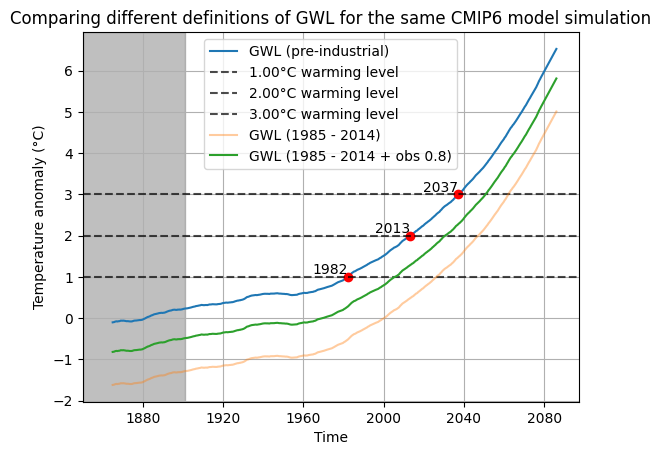

In [16]:
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots()
GWL_diag.visualize(result_GWL, detailed=True, label="GWL (pre-industrial)")
GWL_additional_warming_diag.visualize(result_GWL_additional, detailed=False, add_obs_warming=0.8)
plt.title("Comparing different definitions of GWL for the same CMIP6 model simulation")
ax.legend()
plt.show()

### Illustrate the difference between the two methods
The ideas is to see the the difference between the two methods by:
1. Comparing the additional warming between the GWL and the reference period (historical)
2. Comparing the pre-industrial GWL of the periods calculated by the two methods

In [324]:
def GWL_comparison_all(ds, pre_ind_ref, historical_ref=slice('1985', '2014'), obs_since_preind=0, rol_years=30, levels=[1,2,3], freq_monthly=True):
    GWL_origianl = GWL(ds, pre_ind_ref, rol_years, levels, freq_monthly)
    GWL_additional = GWL_additional_warming(ds, ds.sel(time=historical_ref), obs_since_preind, rol_years, levels, freq_monthly)
    ref_period = pd.to_datetime(ds.sel(time=historical_ref).time.values[len(ds.sel(time=historical_ref).time)//2])
    return GWL_comparison(GWL_origianl[0], GWL_origianl[1], {k+obs_since_preind:v for k,v in GWL_additional[1].items()}, ref_period)

def GWL_comparison(warming_ds, crossing_times_GWL, crossing_times_additional_warming, ref_period):
    """
    Compare the crossing times for different warming levels between the two methods

    Parameters
    ----------
    warming_ds : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    crossing_times_GWL : dict
        Dictionary containing the crossing times for each warming level using the GWL method
    crossing_times_additional_warming : dict
        Dictionary containing the crossing times for each warming level using the additional warming method
    ref_period : datetime.datetime
        Reference period for the warming data - the central date of the reference period is used for the comparison
    
    Returns
    -------
    comparison : pd.DataFrame
        DataFrame containing the comparison between the two methods
    """
    comparison = pd.DataFrame(index=crossing_times_GWL.keys(), columns=[
        'GWL_time', 
        'Additional_warming_time', 
        'Time_Difference', 
        'GWL', 
        'GWL_of_Additional_warming_time',
        'GWL_difference',
        'GWL_warming_since_reference', 
        'Additional_warming_since_reference',
        'Warming_difference'])
    for level in crossing_times_GWL.keys():
        if crossing_times_GWL[level] and crossing_times_additional_warming[level]:
            comparison.loc[level, 'GWL_time'] = crossing_times_GWL[level]
            comparison.loc[level, 'Additional_warming_time'] = crossing_times_additional_warming[level]
            #Difference in pd.Timedelta
            comparison.loc[level, 'Time_Difference'] = pd.to_timedelta(comparison.loc[level, 'GWL_time'] - comparison.loc[level, 'Additional_warming_time'])
            comparison.loc[level, 'GWL'] = warming_ds.sel(time=crossing_times_GWL[level]).values
            comparison.loc[level, 'GWL_of_Additional_warming_time'] = warming_ds.sel(time=crossing_times_additional_warming[level]).values
            comparison.loc[level, 'GWL_difference'] = comparison.loc[level, 'GWL'] - comparison.loc[level, 'GWL_of_Additional_warming_time']
            comparison.loc[level, 'GWL_warming_since_reference'] = comparison.loc[level, 'GWL'] - warming_ds.sel(time=ref_period, method='nearest').values
            comparison.loc[level, 'Additional_warming_since_reference'] = comparison.loc[level, 'GWL_of_Additional_warming_time'] - warming_ds.sel(time=ref_period, method='nearest').values
            comparison.loc[level, 'Warming_difference'] = comparison.loc[level, 'GWL_warming_since_reference'] - comparison.loc[level, 'Additional_warming_since_reference']
    return comparison

def plot_GWL_comparison(comparison, ax, gwl=2, **kwargs):
    """
    Plot the comparison between the two methods

    Parameters
    ----------
    comparison : pd.DataFrame
        DataFrame containing the comparison between the two methods
    ax : matplotlib.axes.Axes
        Axes object to plot the data on
    kwargs : dict
        Additional keyword arguments to pass to the plot
    """
    comparison['GWL_of_Additional_warming_time'] = comparison['GWL_of_Additional_warming_time'].round(2)
    #Make a scatter plot of the difference in warming levels
    comparison.plot.scatter(x='GWL', y='GWL_of_Additional_warming_time', ax=ax, **kwargs)
    return ax

In [325]:
GWL_comp_diag = vp.Model2Ref(GWL_comparison_all, plot_GWL_comparison, 'Warming levels', 'Compare the crossing times for different warming levels between the two methods')

In [326]:
pre_ind_ref = ds.sel(time=slice('1850', '1900'))
comparison = GWL_comp_diag.apply(ds, pre_ind_ref, historical_ref=slice('1985', '2014'), obs_since_preind=0.8, rol_years=30)


<Axes: xlabel='GWL', ylabel='GWL_of_Additional_warming_time'>

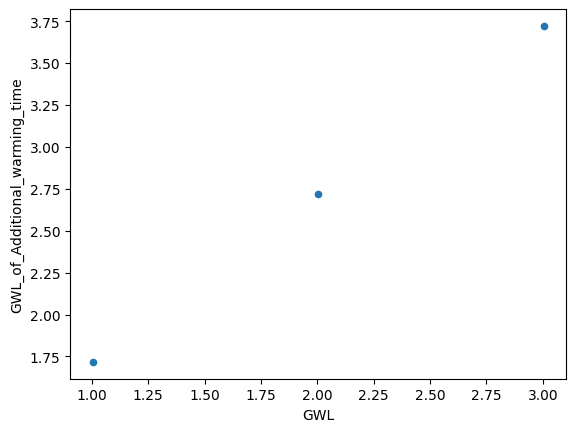

In [327]:
GWL_comp_diag.visualize(comparison)

## Ensemble tests

In [168]:
warming_level_ensemble = vp.Ensemble2Ref.from_model2ref(GWL_comp_diag)

In [169]:
dt_ssp585 = dt.ssp585
dt

DataTree('None', parent=None)
├── DataTree('ssp585')
│   ├── DataTree('GFDL-ESM4')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16T12:00:00 ... 2100-12-16T12...
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/52)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu Jun 24 10:38:59 2021: ncks -v tas tas_mon_...
│   │           source:                    GFDL-ESM4 (2018):\natmos: GFDL-AM4.1 (Cubed-sp...
│   │           institution:               National Oceanic and Atmospheric Administratio...
│   │           Conventions:               CF-1.7 CMIP-6.0 UGRID-1.0
│   │           external_variables:        areacella
│   │           ...                        ...
│   │           variant_label:             r1i1p1f1
│   │           cmip6-ng:                  \ncontact = cmip6-archive@env.ethz.ch\ndescrip...
│   │           original_file_names:       /net/atmos/data/cmip6/historical/Amon/tas/GFDL...
│   │           original_file_hash_codes:  e057084ec0465ff122f8bf6b8ab4e98d3c5e96a3504776...
│   │           CDO:                       Climate Data Operators version 1.9.3 (http://m...
│   │           NCO:                       4.7.2
│   ├── DataTree('GISS-E2-1-G')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16T12:00:00 ... 2100-12-16T12...
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/54)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu Jun 24 10:42:29 2021: ncks -v tas tas_mon_...
│   │           source:                    GISS-E2.1G (2019): \naerosol: Varies with phys...
│   │           institution:               Goddard Institute for Space Studies, New York,...
│   │           Conventions:               CF-1.7 CMIP-6.2
│   │           activity_id:               CMIP
│   │           ...                        ...
│   │           cmor_version:              3.3.2
│   │           cmip6-ng:                  \ncontact = cmip6-archive@env.ethz.ch\ndescrip...
│   │           original_file_names:       /net/atmos/data/cmip6/historical/Amon/tas/GISS...
│   │           original_file_hash_codes:  3fc801bb6e8216909ed6b886898518962a6d3c837a7aa8...
│   │           CDO:                       Climate Data Operators version 1.9.3 (http://m...
│   │           NCO:                       4.7.2
│   ├── DataTree('HadGEM3-GC31-MM')
│   │       Dimensions:  (lat: 144, lon: 192, time: 3012)
│   │       Coordinates:
│   │           height   float64 8B ...
│   │         * lat      (lat) float32 576B -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
│   │         * lon      (lon) float32 768B 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
│   │         * time     (time) datetime64[ns] 24kB 1850-01-16 1850-02-16 ... 2100-12-16
│   │       Data variables:
│   │           tas      (time, lat, lon) float32 333MB dask.array<chunksize=(1213, 144, 192), meta=np.ndarray>
│   │       Attributes: (12/53)
│   │           CDI:                       Climate Data Interface version ?? (http://mpim...
│   │           history:                   Thu

In [170]:
from dask.diagnostics import ProgressBar, Profiler, ResourceProfiler, CacheProfiler
comp = {}
pre_ind_ref = dt.sel(time=slice('1850', '1900'))
for ssp in ['ssp126', 'ssp245', 'ssp370', 'ssp585']:
    with ProgressBar():
        comp[ssp] = warming_level_ensemble.apply(dt[ssp], pre_ind_ref[ssp], historical_ref=slice('1985', '2014'), obs_since_preind=0.8, rol_years=30)

[########################################] | 100% Completed | 2.41 ss
[########################################] | 100% Completed | 1.24 sms
[########################################] | 100% Completed | 1.57 sms
[########################################] | 100% Completed | 1.13 sms
[########################################] | 100% Completed | 1.32 sms
[########################################] | 100% Completed | 1.22 sms
[########################################] | 100% Completed | 1.71 ss
[########################################] | 100% Completed | 1.02 sms
[########################################] | 100% Completed | 1.42 sms
[########################################] | 100% Completed | 1.12 sms
[########################################] | 100% Completed | 1.42 sms
[########################################] | 100% Completed | 1.01 sms
[########################################] | 100% Completed | 1.42 sms
[########################################] | 100% Completed | 1.10 sms
[#######

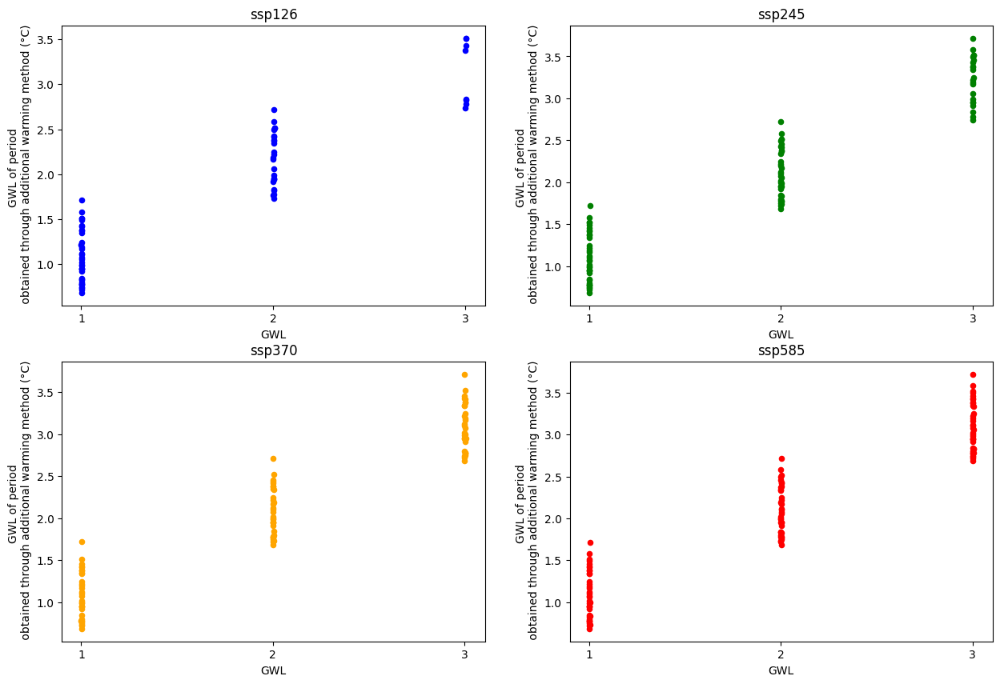

In [182]:

fig, axes = plt.subplots(2,2, figsize=(15,10))
#Define colors for the different scenarios
colors = ['blue', 'green', 'orange', 'red']
for i, ssp, ax in zip(range(4), ['ssp126', 'ssp245', 'ssp370', 'ssp585'], axes.flatten()):
    warming_level_ensemble.visualize(comp[ssp], axes=ax, color=colors[i], facetted=False, legend=False)
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.set_ylabel("GWL of period \n obtained through additional warming method (°C)")
    ax.title.set_text(ssp)
plt.show()

## Regional Warming tests

In [17]:
import regionmask

ds_mutable = dt.ssp585["EC-Earth3-Veg"].to_dataset()
#Add the prudence regions to the dataset
mask = regionmask.defined_regions.prudence.mask_3D(ds_mutable)


In [18]:
r1 = mask.sel(region=6)

In [26]:
def regional_warming_ratio(ds, ref, rol_years=21, freq_monthly=True):
    """
    Calculate the crossing times for different warming levels - the time when the area average warming crosses a certain level compared to the reference period

    Parameters
    ----------
    ds : xarray.Dataset
        Dataset containing the model data
    ref : xarray.Dataset
        Dataset containing the reference period
    levels : list
        List of warming levels to get crossing times for
    rol_years : int
        Number of years to use for the rolling mean
    freq : str, optional
        Frequency of the data (following pandas conventions), default is None and will be inferred from the data
    
    Returns
    -------
    crossingtimes : dict
        Dictionary containing the crossing times for each warming level
    temp_warming : xarray.DataArray
        DataArray containing the area average warming compared to the reference period
    """
    gl_warming = temp_warming(ds, ref, rol_years, freq_monthly)
    region_warming= {}
    for region in mask.region.values:
        #Get the name of the region
        r1 = mask.sel(region=region)
        name_region = str(ds.where(r1).abbrevs.values)
        region_warming[name_region] = temp_warming(ds.where(r1), ref.where(mask.sel(region=region)), rol_years, freq_monthly)
    region_warming = dt.from_dict(region_warming)
    #Top the values at 10 and -10
    warming_ratio = region_warming/gl_warming
    warming_ratio = warming_ratio.where(warming_ratio < 10).where(warming_ratio > -10)
    #Rename tas to warming ratio
    warming_ratio = warming_ratio.rename({'tas':'warming_ratio'})
    return gl_warming, region_warming, warming_ratio

def regional_warming_plot(warming_ds, regional_warming_dt, warming_ratio, ax,plt_warming_ratio=True, **kwargs):
    plot_temp_warming(warming_ds, ax=ax, detailed=True, label="Global warming")
    for node in regional_warming_dt.leaves:
        plot_temp_warming(node.tas, ax=ax, detailed=False, label=node.name, alpha=0.8)
    ax.legend()
    return ax

In [20]:
ref_temp_GWL = ds_mutable.sel(time=slice('1850', '1900'))

with ProgressBar():
    result_regional = regional_warming_ratio(ds_mutable, ref_temp_GWL, rol_years=30, freq_monthly=True)


Text(0.5, 1.0, 'Global and regional warming for EC-Earth3-Veg')

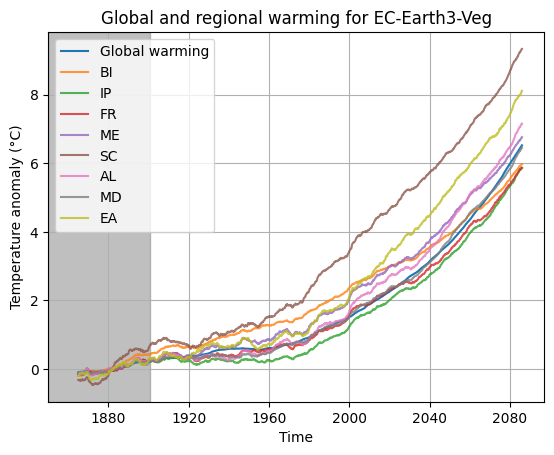

In [28]:
fig, ax = plt.subplots()
regional_warming_plot(result_regional[0], result_regional[1], result_regional[2], ax, plt_warming_ratio=False)
plt.title("Global and regional warming for EC-Earth3-Veg")